In [35]:
#Import libraries

import pandas as pd
import numpy as np
import seaborn as sns

pd.options.mode.chained_assignment = None  # default='warn'

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

#Plots Configuration

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

#Load in the data

df = pd.read_csv(r'C:\Users\PHOENIX\Desktop\movies.csv')

In [4]:
#Overview of the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [6]:
#Checking for missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [12]:
#Check number of missing values for each column

df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [36]:
#The Gross and Revenue are quite important values to the dataset. Due to the spread of the data, the missing values would be replaced with median

df['gross'].fillna(value=df['gross'].median(), inplace=True)
df['budget'].fillna(value=df['budget'].median(), inplace=True)
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,20205757.0,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,20500000.0,20205757.0,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,20205757.0,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,20205757.0,NaN,120.0


In [37]:
#Drop rest of missing values
df = df.dropna(how = 'any', axis = 0)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7574 entries, 0 to 7659
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7574 non-null   object 
 1   rating    7574 non-null   object 
 2   genre     7574 non-null   object 
 3   year      7574 non-null   int64  
 4   released  7574 non-null   object 
 5   score     7574 non-null   float64
 6   votes     7574 non-null   float64
 7   director  7574 non-null   object 
 8   writer    7574 non-null   object 
 9   star      7574 non-null   object 
 10  country   7574 non-null   object 
 11  budget    7574 non-null   float64
 12  gross     7574 non-null   float64
 13  company   7574 non-null   object 
 14  runtime   7574 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 946.8+ KB


In [38]:
#Confirming there are no more missing values

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


In [48]:
#Converting columns to appropriate datatypes

df['votes'] = df['votes'].astype('int64')

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

df['runtime'] = df['runtime'].astype('int64')


In [49]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct,release_year,release_country
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980,"June 13, 1980",United States)
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980,"July 2, 1980",United States)
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980,"June 20, 1980",United States)
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980,"July 2, 1980",United States)
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980,"July 25, 1980",United States)


In [46]:
#Split the release year and country from the released column

df['year_correct'] = df['released'].astype(str).str.split(',').str[-1].astype(str).str[:5]

df[['release_year', 'release_country']] = df['released'].str.split('(', expand=True)

In [50]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct,release_year,release_country
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980,"June 13, 1980",United States)
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980,"July 2, 1980",United States)
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980,"June 20, 1980",United States)
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980,"July 2, 1980",United States)
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980,"July 25, 1980",United States)


In [53]:
#Sort the dataset by Gross

df.sort_values(by = ['gross'], inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct,release_year,release_country
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162,2009,"December 18, 2009",United States)
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181,2019,"April 26, 2019",United States)
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194,1997,"December 19, 1997",United States)
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138,2015,"December 18, 2015",United States)
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149,2018,"April 27, 2018",United States)
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118,2019,"July 19, 2019",United States)
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124,2015,"June 12, 2015",United States)
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143,2012,"May 4, 2012",United States)
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137,2015,"April 3, 2015",United States)
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103,2019,"November 22, 2019",United States)


In [52]:
#Getting a view of the whole dataset

pd.set_option('display.max_rows', None)

In [83]:
#Dropping duplicates

#df['company'].drop_duplicates().sort_values(ascending = False)

In [55]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct,release_year,release_country
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146,1980,"June 13, 1980",United States)
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104,1980,"July 2, 1980",United States)
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124,1980,"June 20, 1980",United States)
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88,1980,"July 2, 1980",United States)
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98,1980,"July 25, 1980",United States)


In [56]:
#Correlation


<function matplotlib.pyplot.show(close=None, block=None)>

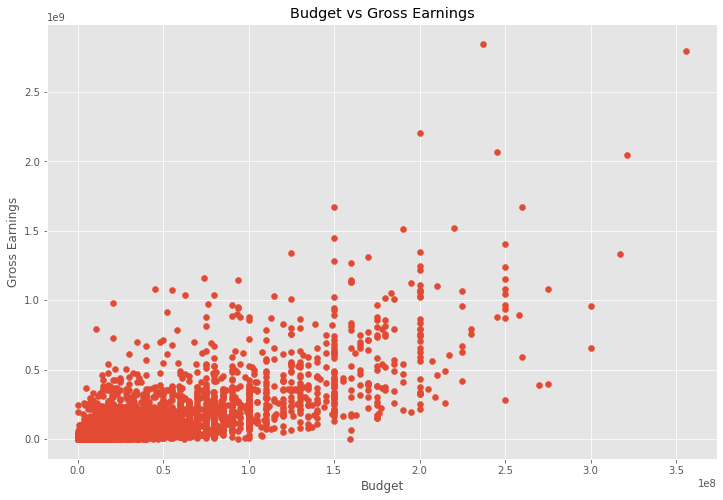

In [58]:
#Scatterplot of budget vs gross

plt.scatter(x = df['budget'], y = df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Budget')

plt.ylabel('Gross Earnings')

plt.show

<AxesSubplot:xlabel='budget', ylabel='gross'>

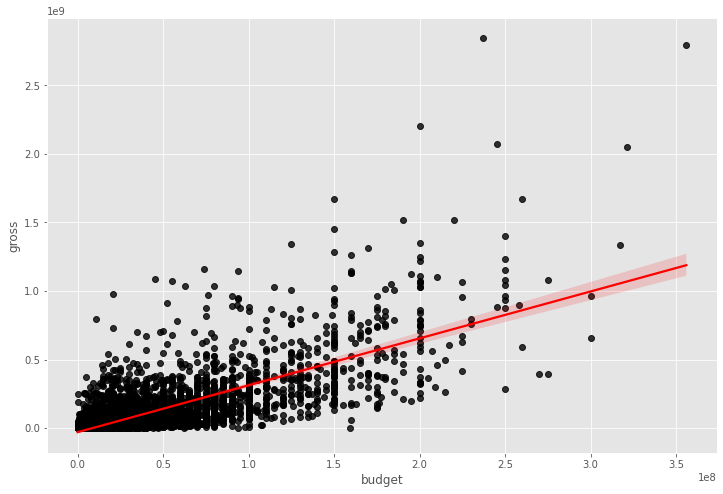

In [60]:
#Creating a regression plot of budget vs gross earning using Seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, scatter_kws = {'color': 'black'}, line_kws = {'color' : 'red'})


In [62]:
#Checking actual correlation

df.corr(method = 'pearson') #Pearson

,year,score,votes,budget,gross,runtime
year,1.000000,0.102346,0.226895,0.296131,0.262150,0.120676
score,0.102346,1.000000,0.411931,0.062535,0.187523,0.400574
votes,0.226895,0.411931,1.000000,0.460066,0.632332,0.309366
budget,0.296131,0.062535,0.460066,1.000000,0.746373,0.273902
gross,0.262150,0.187523,0.632332,0.746373,1.000000,0.244201
runtime,0.120676,0.400574,0.309366,0.273902,0.244201,1.000000


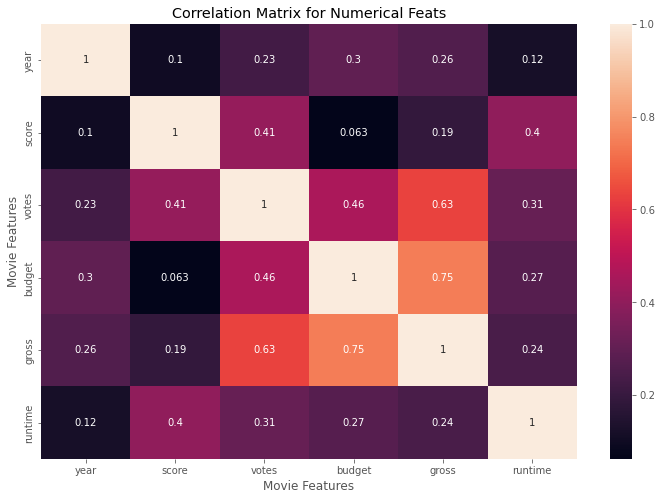

In [66]:
#Visualizing the correlation matrix

corr_matrix = df.corr(method = 'pearson')

sns.heatmap(corr_matrix, annot = True)

plt.title('Correlation Matrix for Numerical Feats')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()

In [67]:
#Looking at non-numerical features

df_num = df

for col_name in df_num.columns:
    if(df_num[col_name].dtype == 'object'):
        df_num[col_name] = df_num[col_name].astype('category')
        df_num[col_name] = df_num[col_name].cat.codes

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,year_correct,release_year,release_country
0,6506,6,6,1980,1685,8.4,927000,2544,3958,1022,54,19000000,46998772,2273,146,0,1495,55
1,5498,6,1,1980,1472,5.8,65000,2233,1612,316,55,4500000,58853106,710,104,0,1296,55
2,5073,4,0,1980,1751,8.7,1200000,1093,2534,1708,55,18000000,538375067,1505,124,0,1553,55
3,282,4,4,1980,1472,7.7,221000,1279,1975,2197,55,3500000,83453539,1769,88,0,1296,55
4,1016,6,4,1980,1523,7.3,108000,1037,511,398,55,6000000,39846344,1736,98,0,1345,55


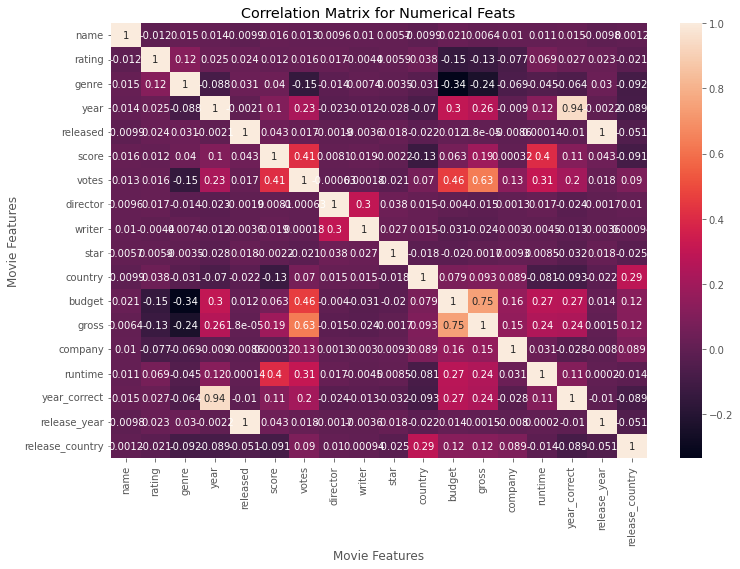

In [69]:
corr_matrix_num = df_num.corr(method = 'pearson')

sns.heatmap(corr_matrix_num, annot = True)

plt.title('Correlation Matrix for Numerical Feats')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')

plt.show()

In [70]:
corr_pairs = corr_matrix_num.unstack()

corr_pairs

name             name               1.000000
                 rating            -0.011924
                 genre              0.015300
                 year               0.013514
                 released          -0.009906
                 score              0.016181
                 votes              0.013180
                 director           0.009608
                 writer             0.010217
                 star               0.005685
                 country           -0.009939
                 budget             0.021356
                 gross              0.006372
                 company            0.010073
                 runtime            0.011151
                 year_correct       0.015057
                 release_year      -0.009847
                 release_country    0.001181
rating           name              -0.011924
                 rating             1.000000
                 genre              0.117566
                 year               0.024989
          

In [71]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre            budget            -0.335494
budget           genre             -0.335494
genre            gross             -0.240351
gross            genre             -0.240351
votes            genre             -0.148420
genre            votes             -0.148420
rating           budget            -0.146362
budget           rating            -0.146362
score            country           -0.130094
country          score             -0.130094
gross            rating            -0.129093
rating           gross             -0.129093
country          year_correct      -0.092821
year_correct     country           -0.092821
release_country  genre             -0.092429
genre            release_country   -0.092429
score            release_country   -0.091491
release_country  score             -0.091491
year_correct     release_country   -0.089436
release_country  year_correct      -0.089436
                 year              -0.089195
year             release_country   -0.089195
          

In [82]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]

high_corr

gross            votes              0.632332
votes            gross              0.632332
budget           gross              0.746373
gross            budget             0.746373
year_correct     year               0.943229
year             year_correct       0.943229
release_year     released           0.999912
released         release_year       0.999912
name             name               1.000000
year_correct     year_correct       1.000000
rating           rating             1.000000
genre            genre              1.000000
year             year               1.000000
released         released           1.000000
score            score              1.000000
votes            votes              1.000000
release_year     release_year       1.000000
director         director           1.000000
star             star               1.000000
country          country            1.000000
budget           budget             1.000000
gross            gross              1.000000
company   

In [ ]:
#Budget and Votes have the highest correlation to gross earnings